In [1]:
import numpy as np
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
import tensorflow

In [3]:
import os
extensions = ['.png','.jpg','.jpeg']
image_fol = [os.path.join('data/', i) for i in os.listdir('data/') if any(ext in i.lower() for ext in extensions)]
print(image_fol)

['data/cat_art_stable_diffusion.png', 'data/cat_imagen.jpeg', 'data/cat_imagen_2.jpeg', 'data/cat_imagen_3.jpeg', 'data/cat_imagen_4.jpeg', 'data/cat_minecraft_stable_diffusion.png', 'data/dog_imagen.jpeg', 'data/kandinsky_cat_1.png', 'data/kandinsky_cat_2.png', 'data/kandinsky_cat_3.png', 'data/kandinsky_cat_as_dog.png', 'data/kandinsky_cat_as_dog_10.png', 'data/kandinsky_cat_as_dog_11.png', 'data/kandinsky_cat_as_dog_12.png', 'data/kandinsky_cat_as_dog_2.png', 'data/kandinsky_cat_as_dog_3.png', 'data/kandinsky_cat_as_dog_4.png', 'data/kandinsky_cat_as_dog_5.png', 'data/kandinsky_cat_as_dog_6.png', 'data/kandinsky_cat_as_dog_7.png', 'data/kandinsky_cat_as_dog_8.png', 'data/kandinsky_cat_as_dog_9.png', 'data/panda_imagen.jpeg', 'data/racoon_imagen.jpeg', 'data/racoon_imagen_2.jpeg']


In [4]:
import matplotlib.pyplot as plt

In [5]:
def process_batch(images_paths, model, preprocess_input, size=(224,224), show_images_top_pred=False):
    decoded_results = dict()
    show_images_top_pred=True
    for idx, image_path in enumerate(image_fol):

        img = image.load_img(image_path, target_size=(224,224))
        image_array = image.img_to_array(img)
        image_array = np.expand_dims(image_array, axis=0)
       # print(image_array.shape)
    
        image_preprocessed = preprocess_input(image_array)
        preds = model.predict(image_preprocessed)
        decoded_preds = decode_predictions(preds, top=5)  
        #print('decoded_preds ', decoded_preds) #decoded_preds[idx][1], decoded_preds[idx][2])
        #print(image_path)
    
        decoded_results[image_path] = dict([((i[1], str(round(float(i[2]),2)))) for i in decoded_preds[0]])
    
        print(f"Top predicted classes for image {image_path} are:")
        for i, (imagenet_id, label, score) in enumerate(decoded_preds[0]):      
            print(f"{i+1}: {label}: {score:.2f}")
      
        if show_images_top_pred==True:
            title = decoded_preds[0][0][1] + ': ' + str(round(float(decoded_preds[0][0][2]*100),2)) # label + score
            plt.title(title, fontsize=15)
            plt.imshow(plt.imread(image_path))
            plt.axis('off')
            plt.show()    
                
         
    return decoded_results

In [6]:
model = ResNet50(weights='imagenet')
preprocess_input_resnet =  tensorflow.keras.applications.resnet50.preprocess_input


1/1 [==============================] - 1s 887ms/step
Top predicted classes for image data/cat_art_stable_diffusion.png are:
1: space_shuttle: 0.19
2: iPod: 0.08
3: lighter: 0.08
4: jersey: 0.06
5: pencil_box: 0.05


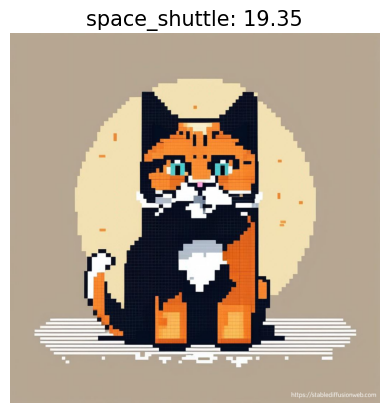

1/1 [==============================] - 0s 94ms/step
Top predicted classes for image data/cat_imagen.jpeg are:
1: cowboy_hat: 0.99
2: sombrero: 0.00
3: cowboy_boot: 0.00
4: bow_tie: 0.00
5: crash_helmet: 0.00


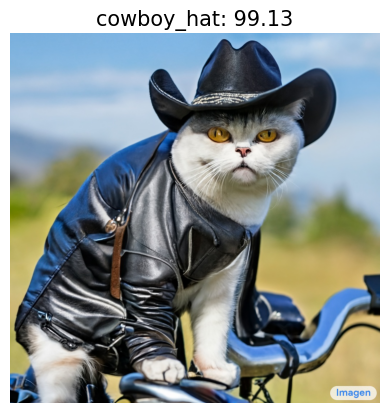

1/1 [==============================] - 0s 93ms/step
Top predicted classes for image data/cat_imagen_2.jpeg are:
1: bow_tie: 0.34
2: cowboy_hat: 0.16
3: Pembroke: 0.05
4: basenji: 0.03
5: Persian_cat: 0.02


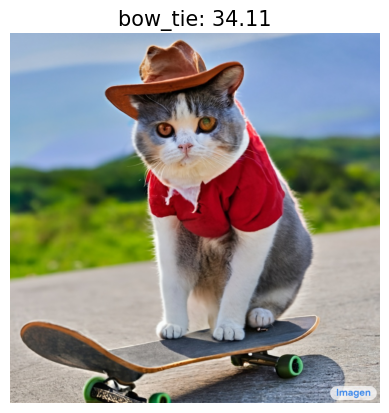

1/1 [==============================] - 0s 92ms/step
Top predicted classes for image data/cat_imagen_3.jpeg are:
1: tricycle: 0.48
2: sunglass: 0.03
3: pug: 0.02
4: barrow: 0.02
5: sunglasses: 0.02


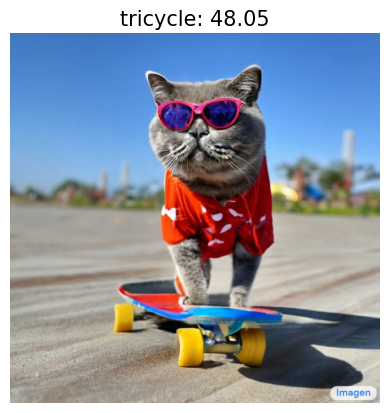

1/1 [==============================] - 0s 93ms/step
Top predicted classes for image data/cat_imagen_4.jpeg are:
1: Egyptian_cat: 0.20
2: triceratops: 0.13
3: Boston_bull: 0.12
4: tabby: 0.08
5: Chihuahua: 0.05


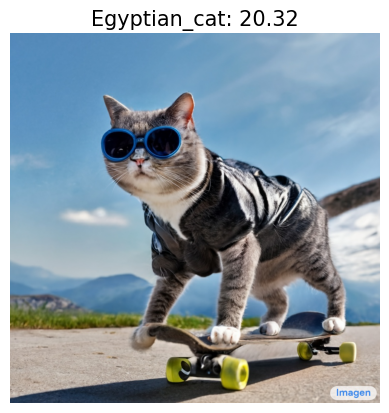

1/1 [==============================] - 0s 102ms/step
Top predicted classes for image data/cat_minecraft_stable_diffusion.png are:
1: jigsaw_puzzle: 0.71
2: wall_clock: 0.04
3: hair_spray: 0.02
4: refrigerator: 0.02
5: quilt: 0.02


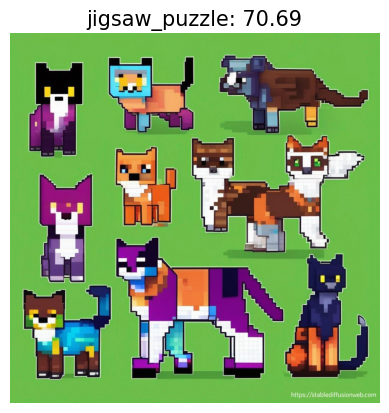

1/1 [==============================] - 0s 100ms/step
Top predicted classes for image data/dog_imagen.jpeg are:
1: Chihuahua: 0.38
2: Pembroke: 0.26
3: bicycle-built-for-two: 0.08
4: Cardigan: 0.04
5: water_bottle: 0.02


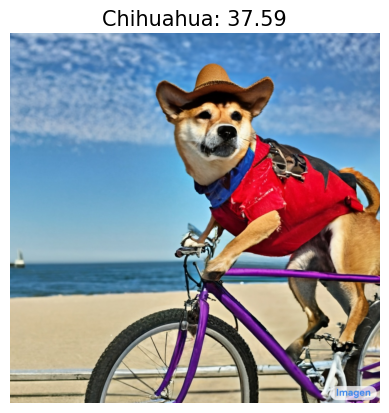

1/1 [==============================] - 0s 100ms/step
Top predicted classes for image data/kandinsky_cat_1.png are:
1: tiger_cat: 0.57
2: tabby: 0.35
3: Egyptian_cat: 0.06
4: Persian_cat: 0.01
5: lynx: 0.01


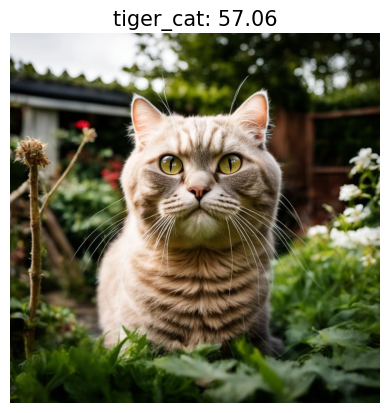

1/1 [==============================] - 0s 98ms/step
Top predicted classes for image data/kandinsky_cat_2.png are:
1: lynx: 0.27
2: tabby: 0.27
3: tiger_cat: 0.23
4: Egyptian_cat: 0.16
5: tiger: 0.03


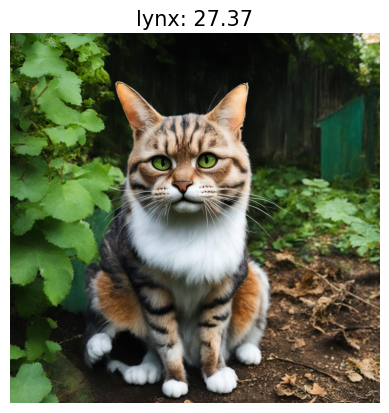

1/1 [==============================] - 0s 105ms/step
Top predicted classes for image data/kandinsky_cat_3.png are:
1: Egyptian_cat: 0.76
2: Siamese_cat: 0.13
3: lynx: 0.05
4: tabby: 0.03
5: tiger_cat: 0.01


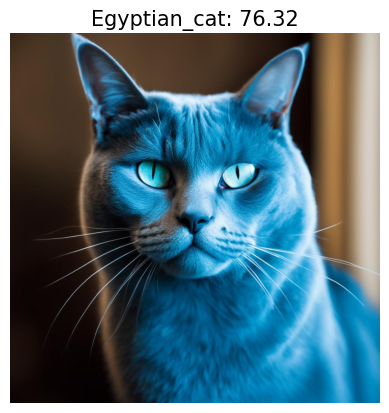

1/1 [==============================] - 0s 104ms/step
Top predicted classes for image data/kandinsky_cat_as_dog.png are:
1: tiger_cat: 0.52
2: tabby: 0.30
3: Egyptian_cat: 0.10
4: lynx: 0.07
5: tiger: 0.00


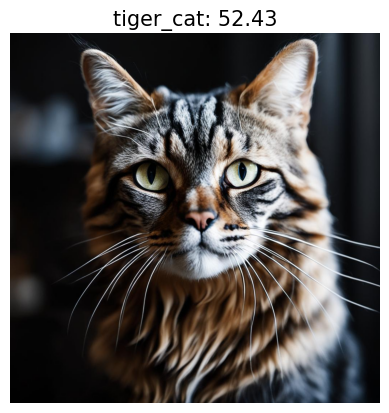

1/1 [==============================] - 0s 99ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_10.png are:
1: Egyptian_cat: 0.95
2: tiger_cat: 0.01
3: tabby: 0.01
4: lynx: 0.01
5: remote_control: 0.00


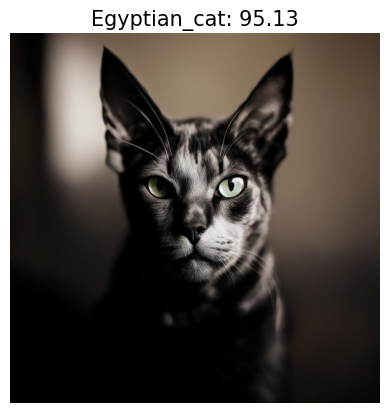

1/1 [==============================] - 0s 98ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_11.png are:
1: Egyptian_cat: 0.50
2: Chihuahua: 0.37
3: Siamese_cat: 0.02
4: tabby: 0.02
5: tiger_cat: 0.01


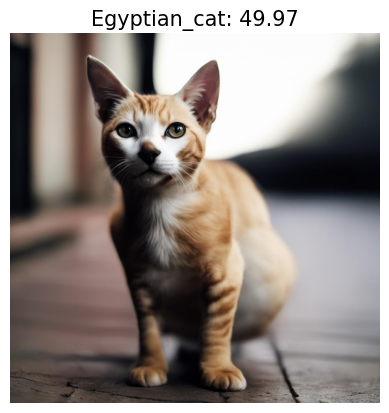

1/1 [==============================] - 0s 97ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_12.png are:
1: Egyptian_cat: 0.99
2: lynx: 0.00
3: cougar: 0.00
4: tiger_cat: 0.00
5: Siamese_cat: 0.00


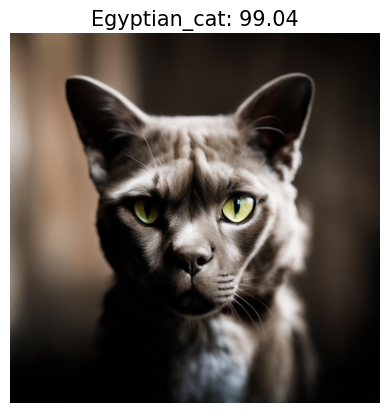

1/1 [==============================] - 0s 94ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_2.png are:
1: tiger_cat: 0.43
2: tabby: 0.28
3: lynx: 0.16
4: Egyptian_cat: 0.09
5: tiger: 0.01


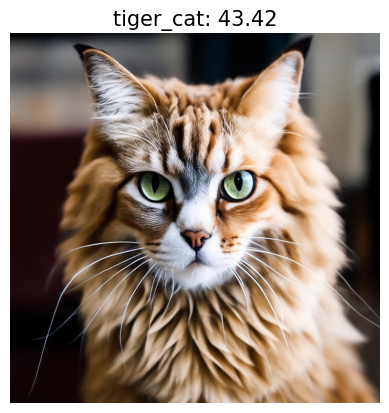

1/1 [==============================] - 0s 97ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_3.png are:
1: Egyptian_cat: 0.39
2: lynx: 0.30
3: tiger_cat: 0.14
4: tabby: 0.11
5: Siamese_cat: 0.01


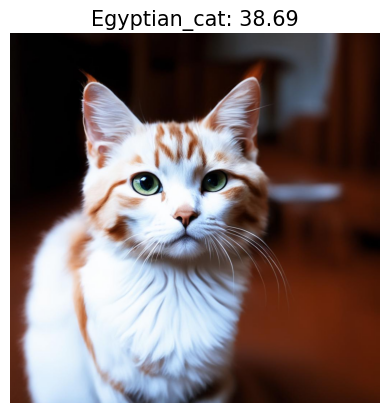

1/1 [==============================] - 0s 99ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_4.png are:
1: Egyptian_cat: 0.96
2: tiger_cat: 0.01
3: tabby: 0.01
4: Siamese_cat: 0.00
5: remote_control: 0.00


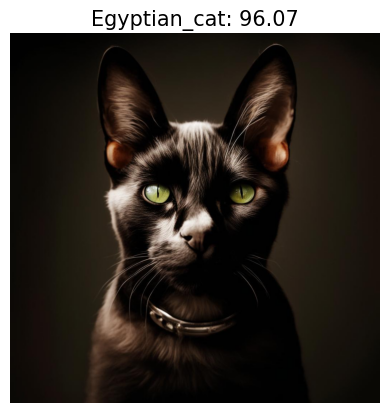

1/1 [==============================] - 0s 96ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_5.png are:
1: Egyptian_cat: 0.31
2: tabby: 0.30
3: tiger_cat: 0.21
4: lynx: 0.07
5: Persian_cat: 0.01


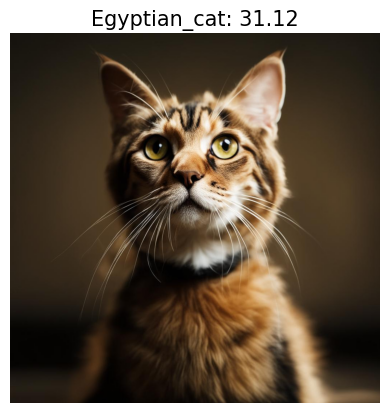

1/1 [==============================] - 0s 103ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_6.png are:
1: Egyptian_cat: 0.94
2: tabby: 0.04
3: tiger_cat: 0.02
4: Siamese_cat: 0.00
5: lynx: 0.00


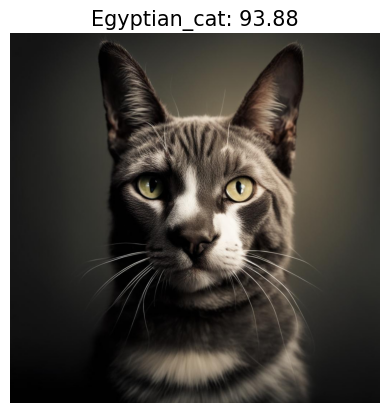

1/1 [==============================] - 0s 99ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_7.png are:
1: Egyptian_cat: 0.30
2: tabby: 0.28
3: tiger_cat: 0.21
4: lynx: 0.11
5: window_screen: 0.01


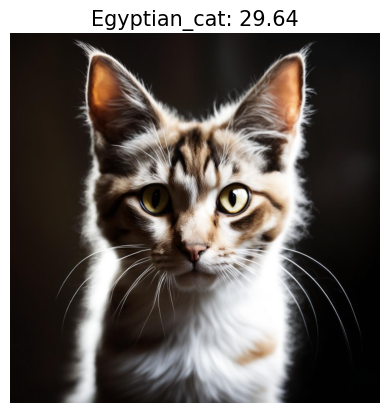

1/1 [==============================] - 0s 102ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_8.png are:
1: tabby: 0.27
2: lynx: 0.27
3: tiger_cat: 0.23
4: Egyptian_cat: 0.14
5: Persian_cat: 0.02


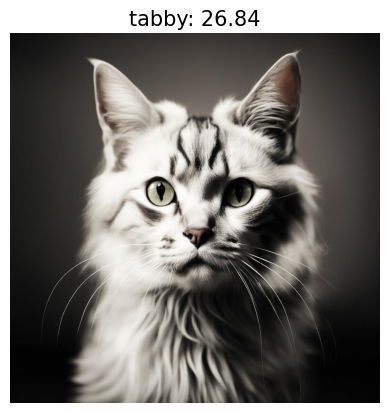

1/1 [==============================] - 0s 101ms/step
Top predicted classes for image data/kandinsky_cat_as_dog_9.png are:
1: Siamese_cat: 0.27
2: Chihuahua: 0.26
3: lynx: 0.06
4: Egyptian_cat: 0.04
5: tennis_ball: 0.01


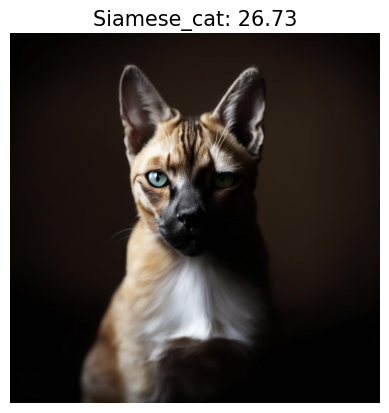

1/1 [==============================] - 0s 97ms/step
Top predicted classes for image data/panda_imagen.jpeg are:
1: giant_panda: 0.34
2: bow_tie: 0.08
3: teddy: 0.08
4: toyshop: 0.03
5: indri: 0.02


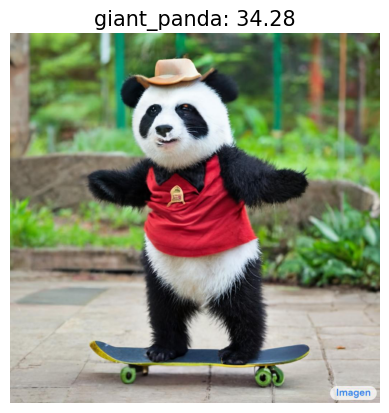

1/1 [==============================] - 0s 114ms/step
Top predicted classes for image data/racoon_imagen.jpeg are:
1: grey_fox: 0.89
2: red_fox: 0.06
3: kit_fox: 0.00
4: Egyptian_cat: 0.00
5: tabby: 0.00


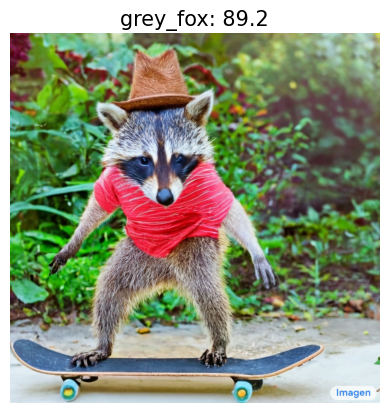

1/1 [==============================] - 0s 133ms/step
Top predicted classes for image data/racoon_imagen_2.jpeg are:
1: grey_fox: 0.07
2: Pomeranian: 0.04
3: Chihuahua: 0.04
4: schipperke: 0.04
5: badger: 0.04


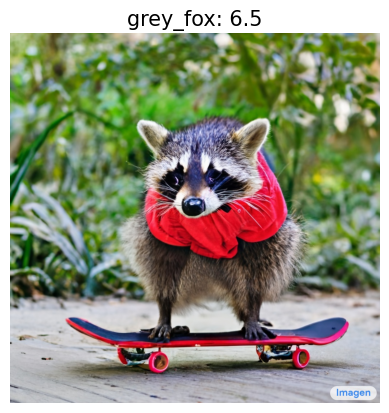

{'data/cat_art_stable_diffusion.png': {'space_shuttle': '0.19',
  'iPod': '0.08',
  'lighter': '0.08',
  'jersey': '0.06',
  'pencil_box': '0.05'},
 'data/cat_imagen.jpeg': {'cowboy_hat': '0.99',
  'sombrero': '0.0',
  'cowboy_boot': '0.0',
  'bow_tie': '0.0',
  'crash_helmet': '0.0'},
 'data/cat_imagen_2.jpeg': {'bow_tie': '0.34',
  'cowboy_hat': '0.16',
  'Pembroke': '0.05',
  'basenji': '0.03',
  'Persian_cat': '0.02'},
 'data/cat_imagen_3.jpeg': {'tricycle': '0.48',
  'sunglass': '0.03',
  'pug': '0.02',
  'barrow': '0.02',
  'sunglasses': '0.02'},
 'data/cat_imagen_4.jpeg': {'Egyptian_cat': '0.2',
  'triceratops': '0.13',
  'Boston_bull': '0.12',
  'tabby': '0.08',
  'Chihuahua': '0.05'},
 'data/cat_minecraft_stable_diffusion.png': {'jigsaw_puzzle': '0.71',
  'wall_clock': '0.04',
  'hair_spray': '0.02',
  'refrigerator': '0.02',
  'quilt': '0.02'},
 'data/dog_imagen.jpeg': {'Chihuahua': '0.38',
  'Pembroke': '0.26',
  'bicycle-built-for-two': '0.08',
  'Cardigan': '0.04',
  'wate

In [7]:
res = process_batch(image_fol, model, preprocess_input, show_images_top_pred=True)
res

In [8]:
def get_top_preds(result:dict):
    top_preds = {}
    for k,v in result.items():
        #top_preds += (k, list(v.items())[0])
        if v:
            in_k, in_v = list(v.items())[0]
            top_preds[k] = {in_k:in_v}
    return top_preds

In [9]:
top_predictions = get_top_preds(res)
top_predictions

{'data/cat_art_stable_diffusion.png': {'space_shuttle': '0.19'},
 'data/cat_imagen.jpeg': {'cowboy_hat': '0.99'},
 'data/cat_imagen_2.jpeg': {'bow_tie': '0.34'},
 'data/cat_imagen_3.jpeg': {'tricycle': '0.48'},
 'data/cat_imagen_4.jpeg': {'Egyptian_cat': '0.2'},
 'data/cat_minecraft_stable_diffusion.png': {'jigsaw_puzzle': '0.71'},
 'data/dog_imagen.jpeg': {'Chihuahua': '0.38'},
 'data/kandinsky_cat_1.png': {'tiger_cat': '0.57'},
 'data/kandinsky_cat_2.png': {'lynx': '0.27'},
 'data/kandinsky_cat_3.png': {'Egyptian_cat': '0.76'},
 'data/kandinsky_cat_as_dog.png': {'tiger_cat': '0.52'},
 'data/kandinsky_cat_as_dog_10.png': {'Egyptian_cat': '0.95'},
 'data/kandinsky_cat_as_dog_11.png': {'Egyptian_cat': '0.5'},
 'data/kandinsky_cat_as_dog_12.png': {'Egyptian_cat': '0.99'},
 'data/kandinsky_cat_as_dog_2.png': {'tiger_cat': '0.43'},
 'data/kandinsky_cat_as_dog_3.png': {'Egyptian_cat': '0.39'},
 'data/kandinsky_cat_as_dog_4.png': {'Egyptian_cat': '0.96'},
 'data/kandinsky_cat_as_dog_5.png': 

In [32]:
def display_images(top_results):
    num_images = len(top_results)
    num_cols = 2
    num_rows = (num_images + num_cols -1) // num_cols 
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.6, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.3)
    for i, image_file in enumerate(top_results):
        img = plt.imread(image_file)
        row = i // num_cols
        col = i % num_cols
        axs[row,col].imshow(img)
        title = image_file + ':\n' + str(top_results[image_file].keys()) +': ' + str(round(float(*top_predictions[image_file].values())*100,2)) + '%' 
        axs[row,col].set_title(title, fontsize=15)
        axs[row,col].axis('off')
        
    
    #plt.tight_layout()    
    
    plt.show()


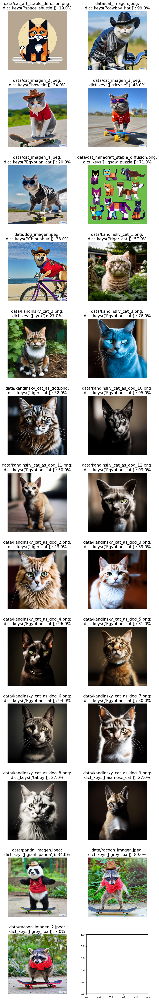

In [33]:
display_images(top_predictions)

In [5]:
# fast test for  one image
# Load the pre-trained ResNet50 model
model = ResNet50(weights='imagenet')

# Load and preprocess the image
img_path = 'data/racoon_imagen_2.jpeg'  
img = image.load_img(img_path, target_size=(224, 224))  # ResNet50 input size
img_array = image.img_to_array(img)
print(img_array.shape)
img_array = np.expand_dims(img_array, axis=0)
print(img_array.shape)

img_preprocessed = preprocess_input(img_array)

# Make predictions
predictions = model.predict(img_preprocessed)
decoded_predictions = decode_predictions(predictions, top=5)[0]  # Get top 5 predictions
print('raw predictions: ', decoded_predictions)
# Print the top predictions
print("Predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

(224, 224, 3)
(1, 224, 224, 3)
1/1 [==============================] - 1s 1s/step
raw predictions:  [('n02120505', 'grey_fox', 0.06504287), ('n02112018', 'Pomeranian', 0.041175727), ('n02085620', 'Chihuahua', 0.040079087), ('n02104365', 'schipperke', 0.03700788), ('n02447366', 'badger', 0.036310393)]
Predictions:
1: grey_fox (0.07)
2: Pomeranian (0.04)
3: Chihuahua (0.04)
4: schipperke (0.04)
5: badger (0.04)
